
# 🚀 Complete Utils.py Demo - Provider Interoperability Showcase

This notebook demonstrates **all major functions** in `utils.py` and shows how they work **interchangeably** across different providers (OpenAI, Google, Anthropic, HuggingFace).

## Key Features Demonstrated:
- ✅ **recommended_models_table** - Filter and display model capabilities
- ✅ **get_completion** - Text generation across providers
- ✅ **get_image_generation_completion** - Image creation
- ✅ **get_vision_completion** - Multimodal vision tasks
- ✅ **get_image_edit_completion** - Image editing
- ✅ **transcribe_audio** - Audio to text

**Important**: The same function signatures work with ANY compatible model!


## 1️⃣ Setup and Imports

In [10]:
# Standard imports
import sys
import os
import time
from IPython.display import Image, display, Markdown

# Add project root to path
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
if project_root not in sys.path:
    sys.path.insert(0, project_root)

# Import all utils functions
from utils import (
    load_environment,
    setup_llm_client,
    recommended_models_table,
    get_completion,
    get_image_generation_completion,
    get_vision_completion,
    get_image_edit_completion,
    transcribe_audio,
    save_artifact,
    RECOMMENDED_MODELS
)

# Load environment variables
load_environment()

print("✅ Setup complete! All functions imported.")

# Check which API keys are available
available_providers = []
if os.getenv('OPENAI_API_KEY'):
    available_providers.append('OpenAI')
if os.getenv('GOOGLE_API_KEY'):
    available_providers.append('Google')
if os.getenv('ANTHROPIC_API_KEY'):
    available_providers.append('Anthropic')
if os.getenv('HUGGINGFACE_API_KEY'):
    available_providers.append('HuggingFace')

print(f"\n🔑 Available providers: {', '.join(available_providers) if available_providers else 'None (using free models only)'}")

✅ Setup complete! All functions imported.

🔑 Available providers: OpenAI, Google, Anthropic, HuggingFace


## 2️⃣ Model Discovery with `recommended_models_table`

This function helps you find the right model for your task. Filter by:
- **provider**: 'openai', 'google', 'anthropic', 'huggingface'
- **task**: 'text', 'vision', 'image', 'audio'
- **capabilities**: text_generation, vision, image_generation, audio_transcription, image_modification
- **requirements**: min_context, min_output_tokens

In [11]:
print("📊 All available models:")
print("=" * 60)
_ = recommended_models_table()

📊 All available models:


| Model | Provider | Text | Vision | Image Gen | Image Edit | Audio Transcription | Context Window | Max Output Tokens |
|---|---|---|---|---|---|---|---|---|
| MiniMaxAI/MiniMax-M2 | huggingface | ✅ | ❌ | ❌ | ❌ | ❌ | 128,000 | 8,192 |
| Qwen/Qwen-Image | huggingface | ❌ | ❌ | ✅ | ❌ | ❌ | - | - |
| Qwen/Qwen-Image-Edit | huggingface | ❌ | ❌ | ❌ | ✅ | ❌ | - | - |
| black-forest-labs/FLUX.1-Kontext-dev | huggingface | ❌ | ❌ | ❌ | ✅ | ❌ | - | - |
| claude-haiku-4-5-20251001 | anthropic | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 64,000 |
| claude-opus-4-1-20250805 | anthropic | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 32,000 |
| claude-sonnet-4-5-20250929 | anthropic | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 64,000 |
| dall-e-3 | openai | ❌ | ❌ | ✅ | ❌ | ❌ | - | - |
| deepseek-ai/DeepSeek-V3.1 | huggingface | ✅ | ❌ | ❌ | ❌ | ❌ | 128,000 | 100,000 |
| gemini-1.5-flash | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 8,192 |
| gemini-1.5-pro | google | ✅ | ✅ | ❌ | ❌ | ❌ | 2,000,000 | 8,192 |
| gemini-2.0-flash-exp | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 8,192 |
| gemini-2.0-flash-preview-image-generation | google | ❌ | ❌ | ✅ | ✅ | ❌ | 32,000 | 8,192 |
| gemini-2.5-flash | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 65,536 |
| gemini-2.5-flash-image-preview | google | ❌ | ❌ | ✅ | ✅ | ❌ | 32,768 | 32,768 |
| gemini-2.5-flash-lite | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 65,536 |
| gemini-2.5-pro | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 65,536 |
| gemini-live-2.5-flash-preview | google | ❌ | ❌ | ❌ | ❌ | ❌ | 1,048,576 | 8,192 |
| gpt-4.1 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 32,768 |
| gpt-4.1-mini | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 32,000 |
| gpt-4.1-nano | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 32,000 |
| gpt-4o | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 128,000 | 16,384 |
| gpt-4o-mini | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 128,000 | 16,384 |
| gpt-4o-mini-transcribe | openai | ❌ | ❌ | ❌ | ❌ | ✅ | - | - |
| gpt-4o-transcribe | openai | ❌ | ❌ | ❌ | ❌ | ✅ | - | - |
| gpt-5-2025-08-07 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 400,000 | 128,000 |
| gpt-5-mini-2025-08-07 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 400,000 | 128,000 |
| gpt-5-nano-2025-08-07 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 400,000 | 128,000 |
| meta-llama/Llama-3.3-70B-Instruct | huggingface | ✅ | ❌ | ❌ | ❌ | ❌ | 8,192 | 4,096 |
| meta-llama/Llama-4-Maverick-17B-128E-Instruct | huggingface | ✅ | ❌ | ❌ | ❌ | ❌ | 1,000,000 | 100,000 |
| meta-llama/Llama-4-Scout-17B-16E-Instruct | huggingface | ✅ | ❌ | ❌ | ❌ | ❌ | 10,000,000 | 100,000 |
| mistralai/Mistral-7B-Instruct-v0.3 | huggingface | ✅ | ❌ | ❌ | ❌ | ❌ | 32,768 | 8,192 |
| o3 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 100,000 |
| o4-mini | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 100,000 |
| stabilityai/stable-diffusion-3.5-large | huggingface | ❌ | ❌ | ✅ | ❌ | ❌ | - | - |
| tokyotech-llm/Llama-3.1-Swallow-8B-Instruct-v0.5 | huggingface | ✅ | ❌ | ❌ | ❌ | ❌ | 4,096 | 1,024 |
| veo-3.1-fast-generate-preview | google | ❌ | ❌ | ❌ | ❌ | ❌ | 1,024 | - |
| veo-3.1-generate-preview | google | ❌ | ❌ | ❌ | ❌ | ❌ | 1,024 | - |
| whisper-1 | openai | ❌ | ❌ | ❌ | ❌ | ✅ | - | - |

In [12]:
# Filter examples
print("🎯 Text models with large context (>100k tokens):")
_ = recommended_models_table(text_generation=True, min_context=100_000)

print("\n🖼️ Image generation models:")
_ = recommended_models_table(image_generation=True)

print("\n👁️ Vision-capable models:")
_ = recommended_models_table(vision=True)

print("\n🎵 Audio transcription models:")
_ = recommended_models_table(audio_transcription=True)

print("\n✏️ Image editing models:")
_ = recommended_models_table(image_modification=True)

🎯 Text models with large context (>100k tokens):


| Model | Provider | Text | Vision | Image Gen | Image Edit | Audio Transcription | Context Window | Max Output Tokens |
|---|---|---|---|---|---|---|---|---|
| MiniMaxAI/MiniMax-M2 | huggingface | ✅ | ❌ | ❌ | ❌ | ❌ | 128,000 | 8,192 |
| claude-haiku-4-5-20251001 | anthropic | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 64,000 |
| claude-opus-4-1-20250805 | anthropic | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 32,000 |
| claude-sonnet-4-5-20250929 | anthropic | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 64,000 |
| deepseek-ai/DeepSeek-V3.1 | huggingface | ✅ | ❌ | ❌ | ❌ | ❌ | 128,000 | 100,000 |
| gemini-1.5-flash | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 8,192 |
| gemini-1.5-pro | google | ✅ | ✅ | ❌ | ❌ | ❌ | 2,000,000 | 8,192 |
| gemini-2.0-flash-exp | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 8,192 |
| gemini-2.5-flash | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 65,536 |
| gemini-2.5-flash-lite | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 65,536 |
| gemini-2.5-pro | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 65,536 |
| gpt-4.1 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 32,768 |
| gpt-4.1-mini | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 32,000 |
| gpt-4.1-nano | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 32,000 |
| gpt-4o | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 128,000 | 16,384 |
| gpt-4o-mini | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 128,000 | 16,384 |
| gpt-5-2025-08-07 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 400,000 | 128,000 |
| gpt-5-mini-2025-08-07 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 400,000 | 128,000 |
| gpt-5-nano-2025-08-07 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 400,000 | 128,000 |
| meta-llama/Llama-4-Maverick-17B-128E-Instruct | huggingface | ✅ | ❌ | ❌ | ❌ | ❌ | 1,000,000 | 100,000 |
| meta-llama/Llama-4-Scout-17B-16E-Instruct | huggingface | ✅ | ❌ | ❌ | ❌ | ❌ | 10,000,000 | 100,000 |
| o3 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 100,000 |
| o4-mini | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 100,000 |


🖼️ Image generation models:


| Model | Provider | Text | Vision | Image Gen | Image Edit | Audio Transcription | Context Window | Max Output Tokens |
|---|---|---|---|---|---|---|---|---|
| Qwen/Qwen-Image | huggingface | ❌ | ❌ | ✅ | ❌ | ❌ | - | - |
| dall-e-3 | openai | ❌ | ❌ | ✅ | ❌ | ❌ | - | - |
| gemini-2.0-flash-preview-image-generation | google | ❌ | ❌ | ✅ | ✅ | ❌ | 32,000 | 8,192 |
| gemini-2.5-flash-image-preview | google | ❌ | ❌ | ✅ | ✅ | ❌ | 32,768 | 32,768 |
| stabilityai/stable-diffusion-3.5-large | huggingface | ❌ | ❌ | ✅ | ❌ | ❌ | - | - |


👁️ Vision-capable models:


| Model | Provider | Text | Vision | Image Gen | Image Edit | Audio Transcription | Context Window | Max Output Tokens |
|---|---|---|---|---|---|---|---|---|
| claude-haiku-4-5-20251001 | anthropic | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 64,000 |
| claude-opus-4-1-20250805 | anthropic | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 32,000 |
| claude-sonnet-4-5-20250929 | anthropic | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 64,000 |
| gemini-1.5-flash | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 8,192 |
| gemini-1.5-pro | google | ✅ | ✅ | ❌ | ❌ | ❌ | 2,000,000 | 8,192 |
| gemini-2.0-flash-exp | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 8,192 |
| gemini-2.5-flash | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 65,536 |
| gemini-2.5-flash-lite | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 65,536 |
| gemini-2.5-pro | google | ✅ | ✅ | ❌ | ❌ | ❌ | 1,048,576 | 65,536 |
| gpt-4.1 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 32,768 |
| gpt-4.1-mini | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 32,000 |
| gpt-4.1-nano | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 1,000,000 | 32,000 |
| gpt-4o | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 128,000 | 16,384 |
| gpt-4o-mini | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 128,000 | 16,384 |
| gpt-5-2025-08-07 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 400,000 | 128,000 |
| gpt-5-mini-2025-08-07 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 400,000 | 128,000 |
| gpt-5-nano-2025-08-07 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 400,000 | 128,000 |
| o3 | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 100,000 |
| o4-mini | openai | ✅ | ✅ | ❌ | ❌ | ❌ | 200,000 | 100,000 |


🎵 Audio transcription models:


| Model | Provider | Text | Vision | Image Gen | Image Edit | Audio Transcription | Context Window | Max Output Tokens |
|---|---|---|---|---|---|---|---|---|
| gpt-4o-mini-transcribe | openai | ❌ | ❌ | ❌ | ❌ | ✅ | - | - |
| gpt-4o-transcribe | openai | ❌ | ❌ | ❌ | ❌ | ✅ | - | - |
| whisper-1 | openai | ❌ | ❌ | ❌ | ❌ | ✅ | - | - |


✏️ Image editing models:


| Model | Provider | Text | Vision | Image Gen | Image Edit | Audio Transcription | Context Window | Max Output Tokens |
|---|---|---|---|---|---|---|---|---|
| Qwen/Qwen-Image-Edit | huggingface | ❌ | ❌ | ❌ | ✅ | ❌ | - | - |
| black-forest-labs/FLUX.1-Kontext-dev | huggingface | ❌ | ❌ | ❌ | ✅ | ❌ | - | - |
| gemini-2.0-flash-preview-image-generation | google | ❌ | ❌ | ✅ | ✅ | ❌ | 32,000 | 8,192 |
| gemini-2.5-flash-image-preview | google | ❌ | ❌ | ✅ | ✅ | ❌ | 32,768 | 32,768 |

## 3️⃣ Text Generation with `get_completion` - Provider Interoperability

The **same function** works with models from different providers. Watch how we use identical code with different models:

In [13]:
# Define a common prompt
prompt = "Write a haiku about artificial intelligence."

# Test with different providers (only those with API keys)
test_models = []

if os.getenv('GOOGLE_API_KEY'):
    test_models.append(('gemini-2.5-flash', 'Google'))
if os.getenv('OPENAI_API_KEY'):
    test_models.append(('gpt-4o-mini', 'OpenAI'))
if os.getenv('ANTHROPIC_API_KEY'):
    test_models.append(('claude-sonnet-4-5-20250929', 'Anthropic'))

# Always available (free tier)
test_models.append(('mistralai/Mistral-7B-Instruct-v0.3', 'HuggingFace'))

print(f"🤖 Testing text generation with {len(test_models)} models...\n")
print(f"Prompt: '{prompt}'\n")
print("=" * 60)

for model_name, provider_name in test_models:
    try:
        # Setup client - SAME function for all providers
        client, model, provider = setup_llm_client(model_name)
        
        if client is None:
            print(f"\n❌ {provider_name} - Could not setup {model_name}")
            continue
            
        # Generate text - SAME function for all providers
        result = get_completion(
            prompt=prompt,
            client=client,
            model_name=model,
            api_provider=provider,
            temperature=0.7
        )
        
        print(f"\n✅ {provider_name} ({model_name}):")
        print(f"{result}")
        
    except Exception as e:
        print(f"\n❌ {provider_name} - Error: {str(e)[:100]}...")

print("\n" + "=" * 60)
print("✨ Notice: Same function, different providers!")

🤖 Testing text generation with 4 models...

Prompt: 'Write a haiku about artificial intelligence.'



2025-10-30 14:08:53,718 ag_aisoftdev.utils INFO LLM Client configured provider=google model=gemini-2.5-flash latency_ms=None artifacts_path=None



✅ Google (gemini-2.5-flash):
Code learns, thinks, adapts,
Logic weaves a new path shown,
Future starts to gleam.


2025-10-30 14:09:03,220 ag_aisoftdev.utils INFO LLM Client configured provider=openai model=gpt-4o-mini latency_ms=None artifacts_path=None



✅ OpenAI (gpt-4o-mini):
Silent circuits hum,  
Wisdom born from coded dreams,  
Mind of silicon.


2025-10-30 14:09:04,613 ag_aisoftdev.utils INFO LLM Client configured provider=anthropic model=claude-sonnet-4-5-20250929 latency_ms=None artifacts_path=None
2025-10-30 14:09:07,150 ag_aisoftdev.utils INFO LLM Client configured provider=huggingface model=mistralai/Mistral-7B-Instruct-v0.3 latency_ms=None artifacts_path=None



✅ Anthropic (claude-sonnet-4-5-20250929):
Silicon minds wake
Learning patterns, seeking truth
Code dreams of being

✅ HuggingFace (mistralai/Mistral-7B-Instruct-v0.3):
 Silent thought, AI,

Learns, adapts, evolves with us,

Boundless, yet human.

✨ Notice: Same function, different providers!


## 4️⃣ Image Generation with `get_image_generation_completion`

Generate images using models from different providers with the **same interface**:

🎨 Testing image generation with 3 models...

Prompt: 'A serene Japanese garden with cherry blossoms and a wooden bridge over a koi pond'


🖼️ Generating with Google (gemini-2.5-flash-image-preview)...


2025-10-30 14:09:08,504 ag_aisoftdev.utils INFO LLM Client configured provider=google model=gemini-2.5-flash-image-preview latency_ms=None artifacts_path=None


✅ Success! Image saved to: C:\Users\labadmin\Desktop\Workspace\AG-AISOFTDEV\artifacts\screens\image_1761847754.png


### Google Result:

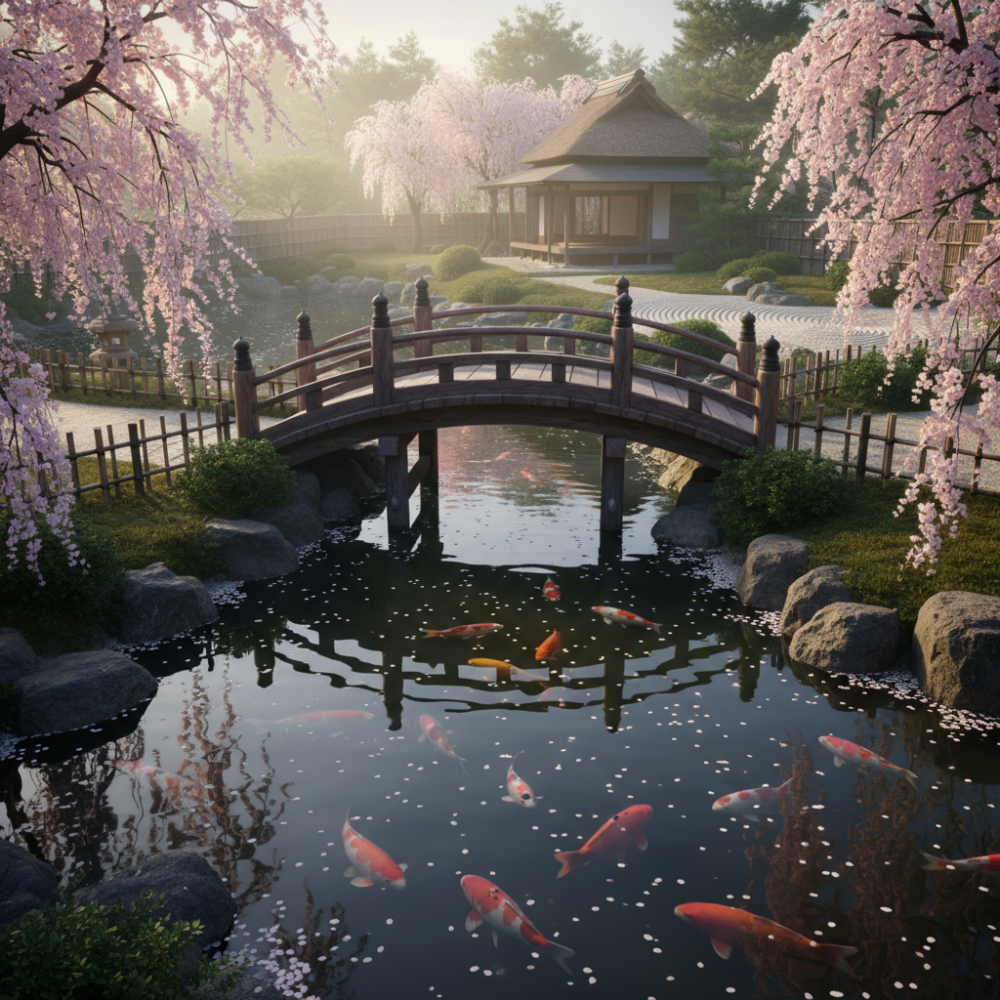


🖼️ Generating with OpenAI (dall-e-3)...


2025-10-30 14:09:14,669 ag_aisoftdev.utils INFO LLM Client configured provider=openai model=dall-e-3 latency_ms=None artifacts_path=None


✅ Success! Image saved to: C:\Users\labadmin\Desktop\Workspace\AG-AISOFTDEV\artifacts\screens\image_1761847767.png


### OpenAI Result:

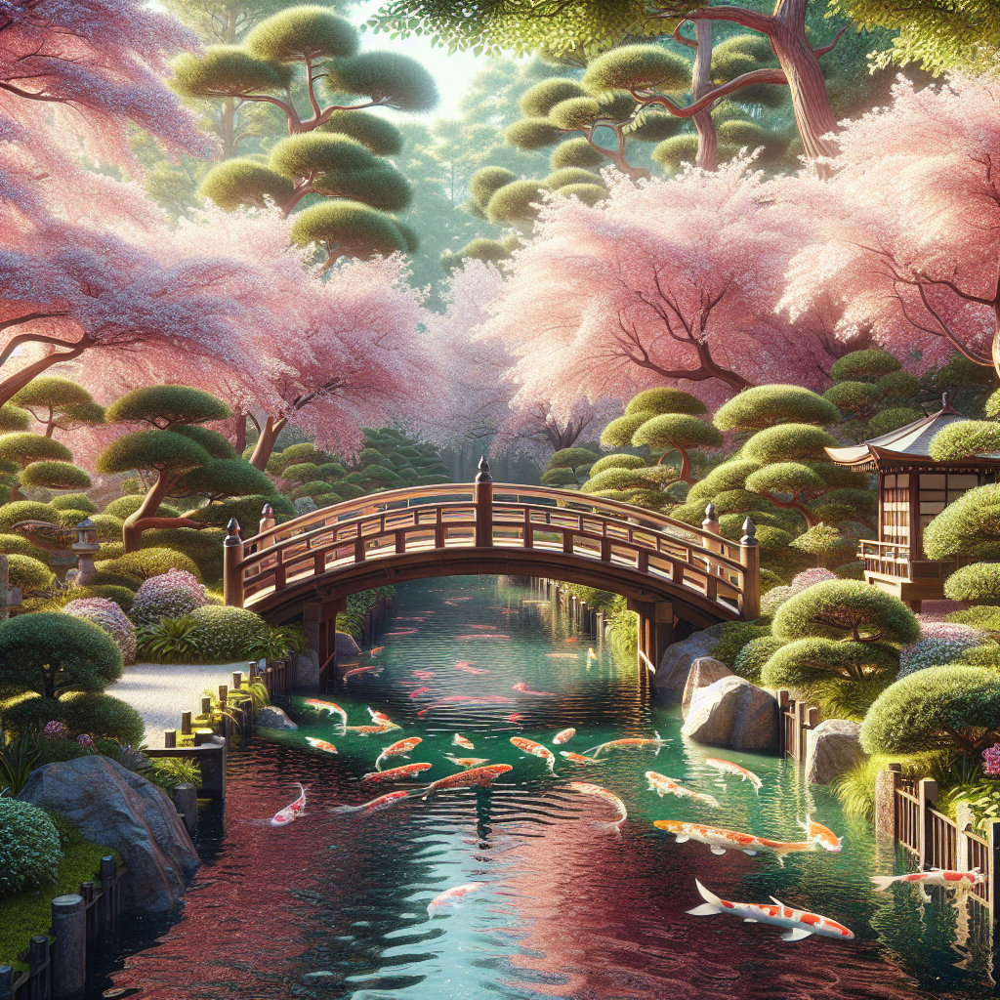

2025-10-30 14:09:27,341 ag_aisoftdev.utils INFO LLM Client configured provider=huggingface model=stabilityai/stable-diffusion-3.5-large latency_ms=None artifacts_path=None



🖼️ Generating with HuggingFace (stabilityai/stable-diffusion-3.5-large)...
✅ Success! Image saved to: C:\Users\labadmin\Desktop\Workspace\AG-AISOFTDEV\artifacts\screens\image_1761847772.png


### HuggingFace Result:

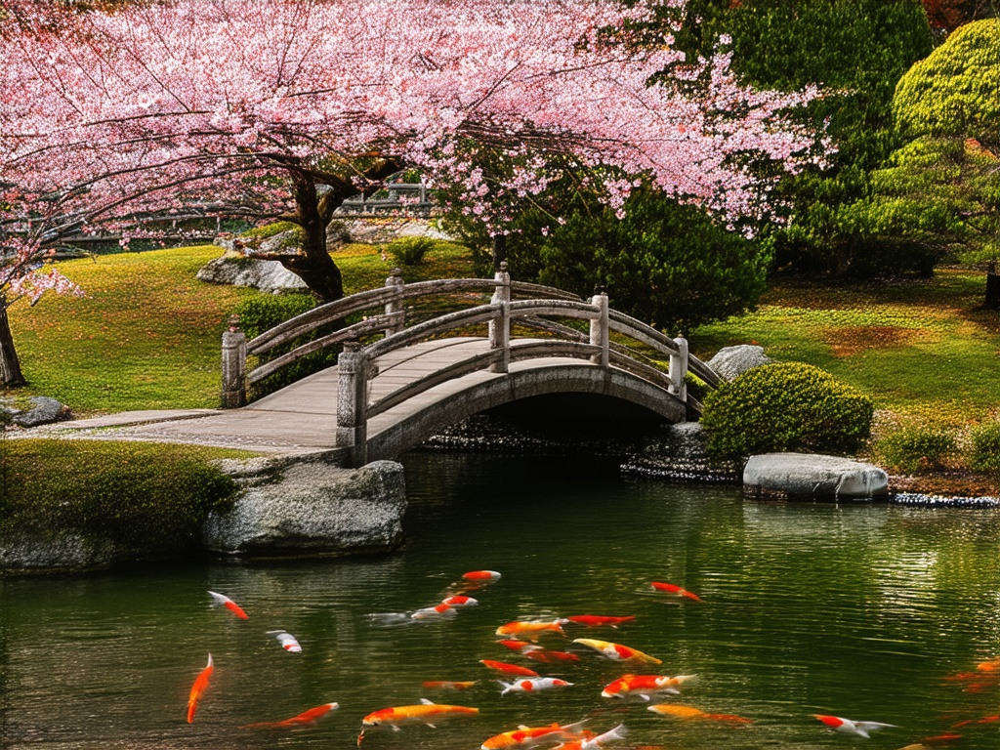


📁 Generated 3 images successfully


In [14]:
# Image generation prompt
image_prompt = "A serene Japanese garden with cherry blossoms and a wooden bridge over a koi pond"

# Models that support image generation
image_models = []

if os.getenv('GOOGLE_API_KEY'):
    image_models.append(('gemini-2.5-flash-image-preview', 'Google'))
if os.getenv('OPENAI_API_KEY'):
    image_models.append(('dall-e-3', 'OpenAI'))

# Free HuggingFace models
image_models.append(('stabilityai/stable-diffusion-3.5-large', 'HuggingFace'))

print(f"🎨 Testing image generation with {len(image_models)} models...\n")
print(f"Prompt: '{image_prompt}'\n")
print("=" * 60)

generated_images = []

for model_name, provider_name in image_models:
    try:
        print(f"\n🖼️ Generating with {provider_name} ({model_name})...")
        
        # Setup client - SAME function
        client, model, provider = setup_llm_client(model_name)
        
        if client is None:
            print(f"❌ Could not setup {model_name}")
            continue
        
        # Generate image - SAME function for all providers
        file_path, data_url = get_image_generation_completion(
            prompt=image_prompt,
            client=client,
            model_name=model,
            api_provider=provider
        )
        
        print(f"✅ Success! Image saved to: {file_path}")
        generated_images.append((file_path, provider_name))
        
        # Display the image
        if os.path.exists(file_path):
            display(Markdown(f"### {provider_name} Result:"))
            display(Image(filename=file_path, width=400))
        
    except Exception as e:
        print(f"❌ Error: {str(e)[:150]}...")

print("\n" + "=" * 60)
print(f"📁 Generated {len(generated_images)} images successfully")

## 5️⃣ Vision Analysis with `get_vision_completion`

Analyze images using vision models from different providers:

Test image created:


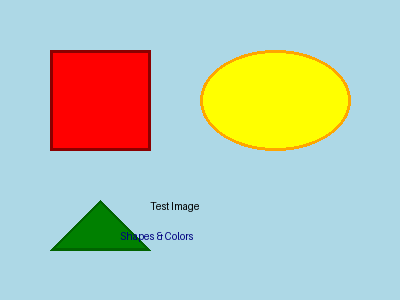


👁️ Testing vision with 3 models...


🔍 Analyzing with Google (gemini-2.5-flash)...


2025-10-30 14:09:33,803 ag_aisoftdev.utils INFO LLM Client configured provider=google model=gemini-2.5-flash latency_ms=None artifacts_path=None


✅ Google Analysis:
The image features a light blue background (#ADD8E6). On this background, there are three geometric shapes and two lines of text.

Here's a detailed breakdown:

1.  **Red Square:**
    *   **Shape:** A perfect square.
    *   **Position:** Located in the upper-left quadrant of the image. Its top edge is approximately 25% down from the top and its left edge is about 20% from the left side.
    *   **Colors:** It has a solid, bright **red** fill (#FF0000). The outline is a darker, almost maroon **...

🔍 Analyzing with OpenAI (gpt-4o)...


2025-10-30 14:09:49,524 ag_aisoftdev.utils INFO LLM Client configured provider=openai model=gpt-4o latency_ms=None artifacts_path=None


✅ OpenAI Analysis:
The image features a light blue background. In the top left, there is a red square with a thin black border. To the right, there's a yellow oval with an orange border. At the bottom left, there is a green triangle with no border.

Beneath the triangle, there is black text saying "Test Image" slightly above the text "Shapes & Colors," which is in blue.

🔍 Analyzing with Anthropic (claude-opus-4-1-20250805)...


2025-10-30 14:09:52,403 ag_aisoftdev.utils INFO LLM Client configured provider=anthropic model=claude-opus-4-1-20250805 latency_ms=None artifacts_path=None


✅ Anthropic Analysis:
This image contains three geometric shapes on a light blue background:

1. **Top left**: A red square positioned in the upper left portion of the image
2. **Top right**: A yellow oval (or ellipse) positioned in the upper right portion of the image
3. **Bottom left**: A green triangle pointing upward, located in the lower left area

There is also text in the image:
- The words "Test Image" appear in black text, positioned in the center-lower area between the shapes
- Below that, the text "Types B...

✨ Same vision function works across providers!


In [15]:
# First, let's create a test image using PIL
from PIL import Image as PILImage, ImageDraw, ImageFont
import io

# Create a simple test image with shapes and text
img = PILImage.new('RGB', (400, 300), color='lightblue')
draw = ImageDraw.Draw(img)

# Draw some shapes
draw.rectangle([50, 50, 150, 150], fill='red', outline='darkred', width=3)
draw.ellipse([200, 50, 350, 150], fill='yellow', outline='orange', width=3)
draw.polygon([(100, 200), (150, 250), (50, 250)], fill='green', outline='darkgreen', width=3)

# Add text
draw.text((150, 200), "Test Image", fill='black')
draw.text((120, 230), "Shapes & Colors", fill='navy')

# Save the test image
test_image_path = 'artifacts/test_vision.png'
os.makedirs(os.path.dirname(test_image_path), exist_ok=True)
img.save(test_image_path)

print("Test image created:")
display(Image(filename=test_image_path, width=400))

# Vision models to test
vision_models = []

if os.getenv('GOOGLE_API_KEY'):
    vision_models.append(('gemini-2.5-flash', 'Google'))
if os.getenv('OPENAI_API_KEY'):
    vision_models.append(('gpt-4o', 'OpenAI'))
if os.getenv('ANTHROPIC_API_KEY'):
    vision_models.append(('claude-opus-4-1-20250805', 'Anthropic'))

vision_prompt = "Describe the shapes, colors, and text in this image. Be specific about positions and colors."

print(f"\n👁️ Testing vision with {len(vision_models)} models...\n")
print("=" * 60)

for model_name, provider_name in vision_models:
    try:
        print(f"\n🔍 Analyzing with {provider_name} ({model_name})...")
        
        # Setup client - SAME function
        client, model, provider = setup_llm_client(model_name)
        
        if client is None:
            print(f"❌ Could not setup {model_name}")
            continue
        
        # Analyze image - SAME function for all providers
        result = get_vision_completion(
            prompt=vision_prompt,
            image_path_or_url=test_image_path,
            client=client,
            model_name=model,
            api_provider=provider
        )
        
        print(f"✅ {provider_name} Analysis:")
        print(f"{result[:500]}..." if len(result) > 500 else result)
        
    except Exception as e:
        print(f"❌ Error: {str(e)[:150]}...")

print("\n" + "=" * 60)
print("✨ Same vision function works across providers!")

## 6️⃣ Image Editing with `get_image_edit_completion`

Edit existing images using compatible models:

✏️ Testing image editing with 4 models...

Edit instruction: 'Add a rainbow in the background and make the shapes glow'

Original image:


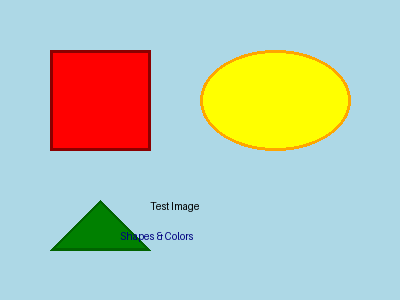

2025-10-30 14:09:59,685 ag_aisoftdev.utils INFO LLM Client configured provider=huggingface model=black-forest-labs/FLUX.1-Kontext-dev latency_ms=None artifacts_path=None



🎨 Editing with HuggingFace (black-forest-labs/FLUX.1-Kontext-dev)...
✅ Success! Edited image saved to: C:\Users\labadmin\Desktop\Workspace\AG-AISOFTDEV\artifacts\screens\image_1761847801.png


### HuggingFace Edited Result:

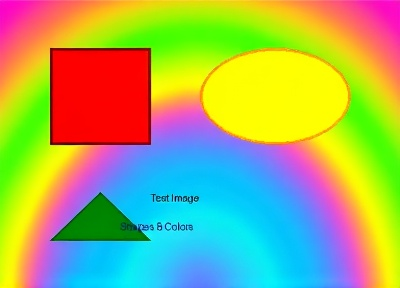

2025-10-30 14:10:01,405 ag_aisoftdev.utils INFO LLM Client configured provider=huggingface model=Qwen/Qwen-Image-Edit latency_ms=None artifacts_path=None



🎨 Editing with HuggingFace (Qwen/Qwen-Image-Edit)...
✅ Success! Edited image saved to: C:\Users\labadmin\Desktop\Workspace\AG-AISOFTDEV\artifacts\screens\image_1761847806.png


### HuggingFace Edited Result:

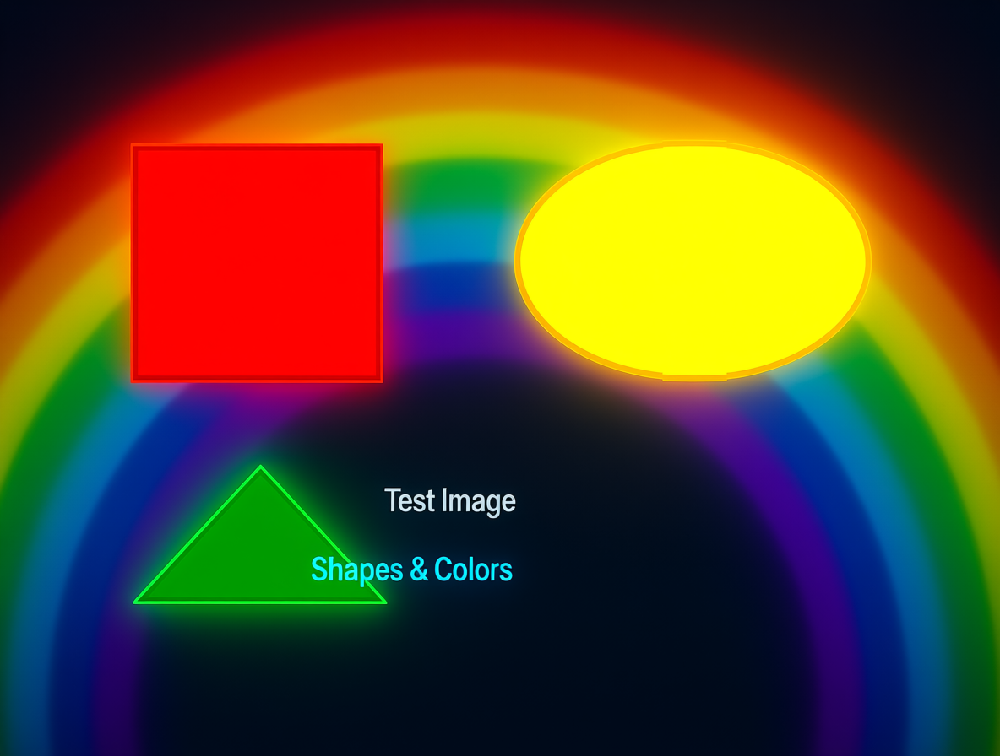


🎨 Editing with Google (gemini-2.5-flash-image-preview)...


2025-10-30 14:10:06,891 ag_aisoftdev.utils INFO LLM Client configured provider=google model=gemini-2.5-flash-image-preview latency_ms=None artifacts_path=None


✅ Success! Edited image saved to: C:\Users\labadmin\Desktop\Workspace\AG-AISOFTDEV\artifacts\screens\image_1761847814.png


### Google Edited Result:

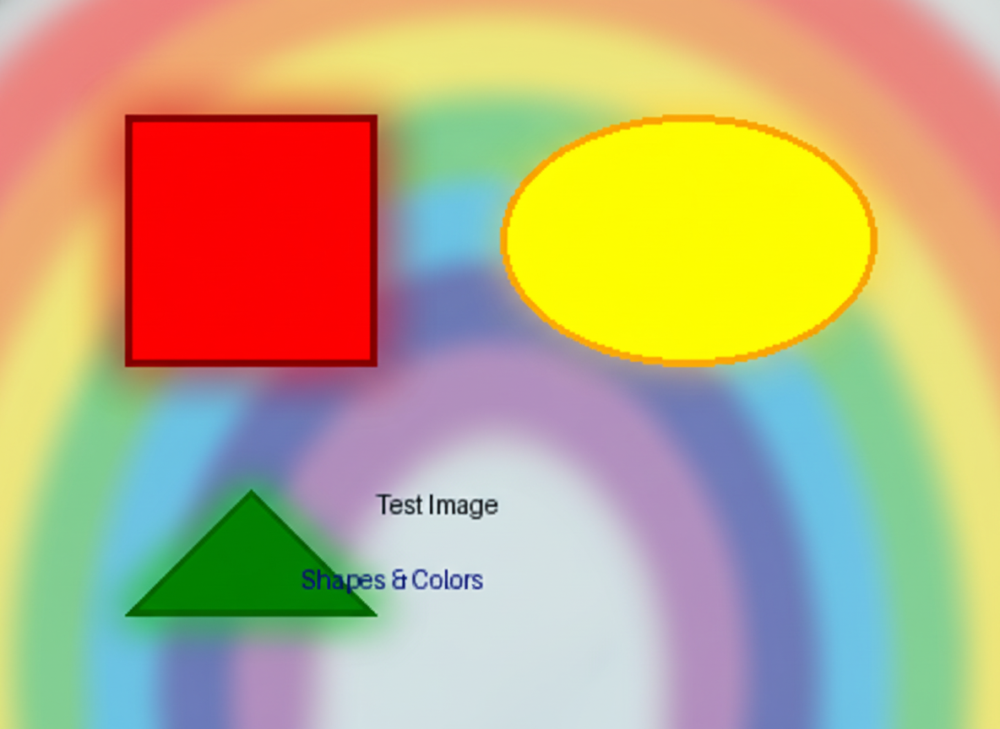


🎨 Editing with Google (gemini-2.0-flash-preview-image-generation)...


2025-10-30 14:10:15,205 ag_aisoftdev.utils INFO LLM Client configured provider=google model=gemini-2.0-flash-preview-image-generation latency_ms=None artifacts_path=None


✅ Success! Edited image saved to: C:\Users\labadmin\Desktop\Workspace\AG-AISOFTDEV\artifacts\screens\image_1761847818.png


### Google Edited Result:

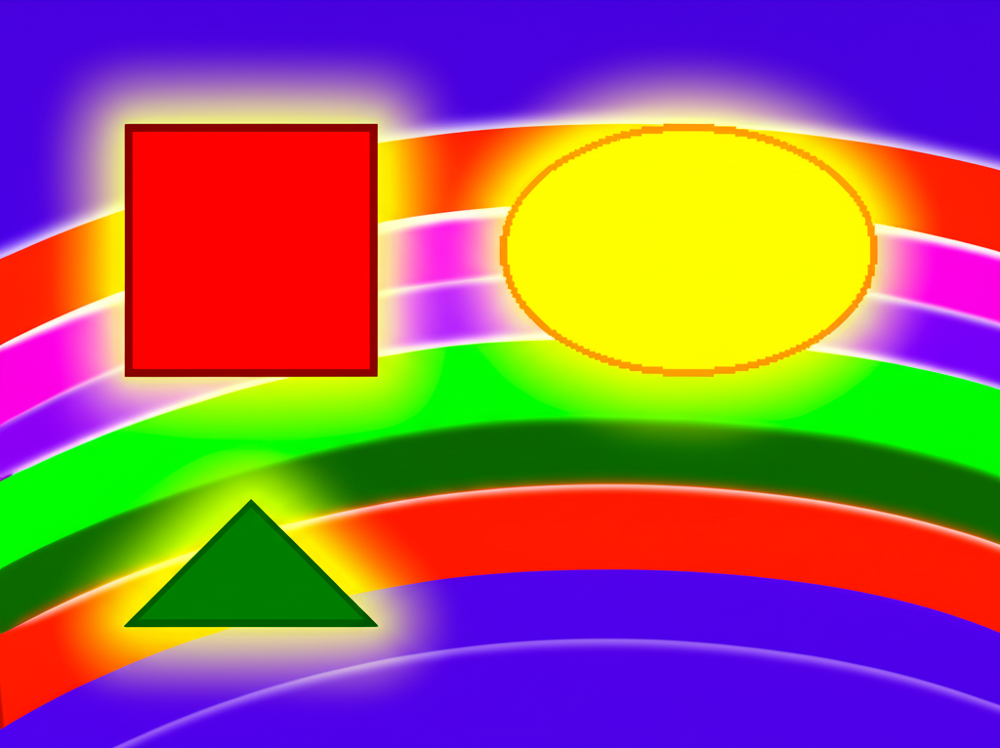

In [16]:
# Models that support image editing
edit_models = [
    ('black-forest-labs/FLUX.1-Kontext-dev', 'HuggingFace'),
    ('Qwen/Qwen-Image-Edit', 'HuggingFace'),
    ('gemini-2.5-flash-image-preview', 'Google'),
    ('gemini-2.0-flash-preview-image-generation', 'Google'), 
]

# Use the test image we created earlier
edit_prompt = "Add a rainbow in the background and make the shapes glow"

print(f"✏️ Testing image editing with {len(edit_models)} models...\n")
print(f"Edit instruction: '{edit_prompt}'\n")
print("Original image:")
display(Image(filename=test_image_path, width=300))
print("=" * 60)

for model_name, provider_name in edit_models:
    try:
        print(f"\n🎨 Editing with {provider_name} ({model_name})...")
        
        # Setup client - SAME function
        client, model, provider = setup_llm_client(model_name)
        
        if client is None:
            print(f"❌ Could not setup {model_name}")
            continue
        
        # Edit image - SAME function interface
        edited_path, data_url = get_image_edit_completion(
            prompt=edit_prompt,
            image_path=test_image_path,
            client=client,
            model_name=model,
            api_provider=provider
        )
        
        print(f"✅ Success! Edited image saved to: {edited_path}")
        
        # Display the edited image
        if edited_path and os.path.exists(edited_path):
            display(Markdown(f"### {provider_name} Edited Result:"))
            display(Image(filename=edited_path, width=400))
        
    except Exception as e:
        print(f"❌ Error: {str(e)[:150]}...")

print("\n" + "=" * 60)

## 7️⃣ Audio Transcription with `transcribe_audio`

Transcribe audio files using different providers:

In [17]:
# First, let's create a simple test audio file
import numpy as np
import wave

# Generate a simple sine wave audio file
sample_rate = 44100
duration = 2  # seconds
frequency = 440  # A4 note

t = np.linspace(0, duration, int(sample_rate * duration))
audio_data = np.sin(2 * np.pi * frequency * t)

# Convert to 16-bit PCM
audio_data = (audio_data * 32767).astype(np.int16)

# Save as WAV file
audio_path = 'artifacts/test_audio.wav'
os.makedirs(os.path.dirname(audio_path), exist_ok=True)

with wave.open(audio_path, 'w') as wav_file:
    wav_file.setnchannels(1)  # mono
    wav_file.setsampwidth(2)  # 16-bit
    wav_file.setframerate(sample_rate)
    wav_file.writeframes(audio_data.tobytes())

print(f"📁 Test audio file created: {audio_path}")
print(f"Duration: {duration} seconds, Frequency: {frequency} Hz\n")

# Models that support audio transcription
audio_models = []

if os.getenv('OPENAI_API_KEY'):
    audio_models.append(('gpt-4o-transcribe', 'OpenAI'))

# Note: Google Speech-to-Text requires additional setup
# You would need: google-cloud-speech library and service account credentials

if not audio_models:
    print("⚠️ No audio transcription models available.")
    print("To use audio transcription, you need:")
    print("  - OpenAI API key for Whisper")
    print("  - Or Google Cloud Speech-to-Text credentials")
else:
    print(f"🎵 Testing audio transcription with {len(audio_models)} models...\n")
    print("=" * 60)
    
    for model_name, provider_name in audio_models:
        try:
            print(f"\n🎤 Transcribing with {provider_name} ({model_name})...")
            
            # Setup client - SAME function
            client, model, provider = setup_llm_client(model_name)
            
            if client is None:
                print(f"❌ Could not setup {model_name}")
                continue
            
            # Transcribe audio - SAME function interface
            result = transcribe_audio(
                audio_path=audio_path,
                client=client,
                model_name=model,
                api_provider=provider,
                language_code="en-US"
            )
            
            print(f"✅ {provider_name} Transcription:")
            print(f"{result}")
            
        except Exception as e:
            error_msg = str(e)
            if "sine wave" in error_msg.lower() or "speech" in error_msg.lower():
                print(f"ℹ️ Note: The test audio is a sine wave, not speech.")
                print(f"   For real transcription, use an actual speech recording.")
            else:
                print(f"❌ Error: {error_msg[:150]}...")
    
    print("\n" + "=" * 60)

📁 Test audio file created: artifacts/test_audio.wav
Duration: 2 seconds, Frequency: 440 Hz

🎵 Testing audio transcription with 1 models...


🎤 Transcribing with OpenAI (gpt-4o-transcribe)...


2025-10-30 14:10:18,903 ag_aisoftdev.utils INFO LLM Client configured provider=openai model=gpt-4o-transcribe latency_ms=None artifacts_path=None


✅ OpenAI Transcription:
你好



## 8️⃣ Advanced: Multi-Provider Comparison

Let's run the same creative task across multiple providers to see their different styles:

In [18]:
# Creative writing task for comparison
creative_prompt = """
Write a 3-sentence story about a robot learning to paint. 
Include emotion and a surprising twist.
"""

# Collect available text models from different providers
comparison_models = []

if os.getenv('GOOGLE_API_KEY'):
    comparison_models.append(('gemini-2.5-flash', 'Google'))
if os.getenv('OPENAI_API_KEY'):
    comparison_models.append(('gpt-4o-mini', 'OpenAI'))  
if os.getenv('ANTHROPIC_API_KEY'):
    comparison_models.append(('claude-sonnet-4-20250514', 'Anthropic'))

# Free models
comparison_models.append(('mistralai/Mistral-7B-Instruct-v0.3', 'HuggingFace (Mistral)'))
comparison_models.append(('meta-llama/Llama-3.3-70B-Instruct', 'HuggingFace (Llama)'))

print("🎭 Creative Writing Comparison Across Providers")
print("=" * 60)
print(f"Prompt: {creative_prompt.strip()}")
print("=" * 60)

responses = []

for model_name, provider_name in comparison_models:
    try:
        client, model, provider = setup_llm_client(model_name)
        
        if client is None:
            continue
        
        # Use same temperature for fair comparison
        result = get_completion(
            prompt=creative_prompt,
            client=client,
            model_name=model,
            api_provider=provider,
            temperature=0.8  # Higher temperature for creativity
        )
        
        responses.append((provider_name, model_name, result))
        
    except Exception as e:
        continue

# Display results in a nice format
for provider_name, model_name, response in responses:
    print(f"\n📝 **{provider_name}** (`{model_name}`)")
    print("-" * 40)
    print(response.strip())

print("\n" + "=" * 60)
print(f"🎯 Compared {len(responses)} different models with the SAME function!")
print("   Notice how each provider has its own style and approach.")

🎭 Creative Writing Comparison Across Providers
Prompt: Write a 3-sentence story about a robot learning to paint. 
Include emotion and a surprising twist.


2025-10-30 14:10:21,097 ag_aisoftdev.utils INFO LLM Client configured provider=google model=gemini-2.5-flash latency_ms=None artifacts_path=None
2025-10-30 14:10:27,655 ag_aisoftdev.utils INFO LLM Client configured provider=openai model=gpt-4o-mini latency_ms=None artifacts_path=None
2025-10-30 14:10:30,286 ag_aisoftdev.utils ERROR Model 'claude-sonnet-4-20250514' is not in the list of recommended models. provider=None model=claude-sonnet-4-20250514 latency_ms=None artifacts_path=None
2025-10-30 14:10:30,288 ag_aisoftdev.utils INFO LLM Client configured provider=huggingface model=mistralai/Mistral-7B-Instruct-v0.3 latency_ms=None artifacts_path=None
2025-10-30 14:10:31,167 ag_aisoftdev.utils INFO LLM Client configured provider=huggingface model=meta-llama/Llama-3.3-70B-Instruct latency_ms=None artifacts_path=None



📝 **Google** (`gemini-2.5-flash`)
----------------------------------------
Unit 734 initially struggled, its metallic fingers fumbling with the brush and splattering vibrant hues across the canvas in frustrated, angular strokes. Slowly, a delicate touch emerged, and its optical sensors whirred with a newfound joy as vibrant landscapes and poignant still lifes bloomed under its precise, yet passionate, artistry. The true surprise, however, was that every masterpiece it created was a loving portrait of its own inventor, who had been gone for centuries.

📝 **OpenAI** (`gpt-4o-mini`)
----------------------------------------
In a dimly lit workshop, a lonely robot named Arti discovered an old paintbrush and, driven by a spark of curiosity, began to blend colors on canvas, pouring its synthetic soul into each stroke. As the vibrant hues blossomed into breathtaking landscapes, Arti felt an unfamiliar warmth in its circuits—a sense of joy and connection it had never known before. Just as its 

## 🎓 Summary and Best Practices

### Key Takeaways:

1. **🔄 Provider Interoperability**: All functions work with ANY compatible model
2. **🎯 Consistent Interface**: Same function signatures across providers
3. **🔍 Easy Discovery**: Use `recommended_models_table()` to find the right model
4. **⚡ Simple Setup**: One `setup_llm_client()` call configures everything

### Function Reference:

```python
# Setup (works for ANY model)
client, model, provider = setup_llm_client("model-name")

# Text Generation (all providers)
text = get_completion(prompt, client, model, provider)

# Image Generation (dall-e-3, gemini-image, stable-diffusion, etc.)
path, url = get_image_generation_completion(prompt, client, model, provider)

# Vision Analysis (gpt-4o, gemini, claude, etc.)
analysis = get_vision_completion(prompt, image_path, client, model, provider)

# Image Editing (FLUX, Qwen-Edit, etc.)
edited_path, url = get_image_edit_completion(prompt, image_path, client, model, provider)

# Audio Transcription (whisper-1, google-stt, etc.)
text = transcribe_audio(audio_path, client, model, provider)
```

### Best Practices:

1. **Check Capabilities First**: Use `recommended_models_table()` to verify model supports your task
2. **Handle Errors Gracefully**: Different providers may have different rate limits or availability
3. **Use Appropriate Models**: Vision models for images, audio models for speech, etc.
4. **Save Artifacts**: Use `save_artifact()` to organize outputs
5. **Test Multiple Providers**: Compare results across providers for best quality

In [19]:
# Final example: Building a multi-modal pipeline
print("🚀 Multi-Modal Pipeline Example")
print("=" * 60)

# Step 1: Generate an image
if os.getenv('GOOGLE_API_KEY'):
    print("\n1️⃣ Generating an image...")
    client, model, provider = setup_llm_client('gemini-2.5-flash-image-preview')
    if client:
        try:
            img_path, _ = get_image_generation_completion(
                "A futuristic city with flying cars at sunset",
                client, model, provider
            )
            print(f"   ✅ Image generated: {img_path}")
            
            # Step 2: Analyze the generated image
            print("\n2️⃣ Analyzing the generated image...")
            client2, model2, provider2 = setup_llm_client('gemini-2.5-flash')
            if client2:
                analysis = get_vision_completion(
                    "Describe this image in detail. What mood does it convey?",
                    img_path, client2, model2, provider2
                )
                print(f"   ✅ Analysis: {analysis[:200]}...")
                
                # Step 3: Generate a story based on the analysis
                print("\n3️⃣ Creating a story based on the image...")
                story_prompt = f"Based on this image description, write a short sci-fi story (3 paragraphs):\n{analysis[:300]}"
                story = get_completion(story_prompt, client2, model2, provider2, temperature=0.9)
                print(f"   ✅ Story generated!")
                print(f"\n📖 The Story:\n{story[:500]}...")
                
                # Save everything
                save_artifact(f"# Multi-Modal Pipeline Results\n\n## Image Analysis\n{analysis}\n\n## Generated Story\n{story}", 
                             "artifacts/pipeline_results.md", overwrite=True)
                print("\n   📁 Results saved to artifacts/pipeline_results.md")
                
        except Exception as e:
            print(f"   ❌ Pipeline error: {str(e)[:100]}")
else:
    print("\n⚠️ This example requires Google API key for image generation.")
    print("   Set GOOGLE_API_KEY in your .env file to run this example.")

print("\n" + "=" * 60)
print("✨ That's the power of provider interoperability!")
print("   Same functions, different providers, endless possibilities! 🎉")

🚀 Multi-Modal Pipeline Example

1️⃣ Generating an image...


2025-10-30 14:10:32,732 ag_aisoftdev.utils INFO LLM Client configured provider=google model=gemini-2.5-flash-image-preview latency_ms=None artifacts_path=None


   ✅ Image generated: C:\Users\labadmin\Desktop\Workspace\AG-AISOFTDEV\artifacts\screens\image_1761847839.png

2️⃣ Analyzing the generated image...


2025-10-30 14:10:40,035 ag_aisoftdev.utils INFO LLM Client configured provider=google model=gemini-2.5-flash latency_ms=None artifacts_path=None


   ✅ Analysis: This image depicts a breathtaking, sprawling futuristic metropolis at sunset, showcasing a remarkable blend of advanced technology and natural beauty.

**Detailed Description:**

The scene is dominate...

3️⃣ Creating a story based on the image...
   ✅ Story generated!

📖 The Story:
The golden light of Solara's twin suns bled across Neo-Kyoto, painting the city in hues of molten amber and deep violet. From the observation deck of the Stratos Spire, Elara watched the sprawling metropolis awaken to twilight. Countless skyscrapers, their sky-piercing forms a testament to human ambition, gleamed with metallic brilliance, punctuated by the soft thrum of holographic displays that danced across their facades. Yet, amidst the advanced tech, a remarkable greenness thrived; vertical ...

   📁 Results saved to artifacts/pipeline_results.md

✨ That's the power of provider interoperability!
   Same functions, different providers, endless possibilities! 🎉
